In [2]:
import pandas as pd
import numpy as np
from pandasql import sqldf
import seaborn as sns
from matplotlib import pyplot as plt

pysqldf = lambda q: sqldf(q, globals())

In [3]:
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_colwidth', None)

In [4]:
df = pd.read_csv('data/Most-Recent-Cohorts-Field-of-Study.csv')

In [33]:
df_top = pysqldf("""
SELECT DISTINCT 
    INSTNM, 
    CIPDESC, 
    CREDDESC, 
    CREDLEV, 
    CIPCODE,
    EARN_MDN_HI_1YR * 1.0 AS EARN_MED_1YR, 
    EARN_MDN_HI_2YR * 1.0 AS EARN_MED_2YR, 
    DEBT_ALL_STGP_EVAL_MDN * 1.0 AS DEBT_MED,
    EARN_COUNT_WNE_HI_1YR * 1 AS COHORT_SIZE
FROM 
    df
""")

In [34]:
df_top_sector = pysqldf("""
SELECT DISTINCT 
    *,
    CASE 
        WHEN CIPCODE LIKE '51%' THEN 'Health'
        WHEN CIPCODE LIKE '60%' THEN 'Health'
        WHEN CIPCODE LIKE '52%' THEN 'Business'
        WHEN CIPCODE LIKE '22%' THEN 'Law'
        WHEN CIPCODE LIKE '11%' THEN 'STEM'
        WHEN CIPCODE LIKE '14%' THEN 'STEM'
        WHEN CIPCODE LIKE '27%' THEN 'STEM'
    ELSE
        'Other'
    END AS SECTOR
FROM df_top
WHERE CREDLEV >= 5 
AND SECTOR != 'Other'
""")

In [35]:
df_top_sector

,INSTNM,CIPDESC,CREDDESC,CREDLEV,CIPCODE,EARN_MED_1YR,EARN_MED_2YR,DEBT_MED,COHORT_SIZE,SECTOR
0,Alabama A & M University,Food Science and Technology.,Master's Degree,5,110,52107.0,0.0,0.0,13,STEM
1,Alabama A & M University,Food Science and Technology.,Doctoral Degree,6,110,0.0,0.0,0.0,0,STEM
2,Alabama A & M University,"Computer and Information Sciences, General.",Master's Degree,5,1101,47666.0,0.0,0.0,13,STEM
3,Alabama A & M University,"Engineering, Other.",Master's Degree,5,1499,0.0,0.0,0.0,0,STEM
4,Alabama A & M University,Communication Disorders Sciences and Services.,Master's Degree,5,5102,50439.0,55036.0,45968.0,33,Health
5,Alabama A & M University,"Business Administration, Management and Operations.",Master's Degree,5,5202,40737.0,43798.0,50311.0,45,Business
6,University of Alabama at Birmingham,"Computer and Information Sciences, General.",Master's Degree,5,1101,0.0,0.0,0.0,0,STEM
7,University of Alabama at Birmingham,"Computer and Information Sciences, General.",Doctoral Degree,6,1101,0.0,0.0,0.0,0,STEM
8,University of Alabama at Birmingham,Computer/Information Technology Administration and Management.,Master's Degree,5,1110,0.0,0.0,0.0,0,STEM
9,University of Alabama at Birmingham,Computer/Information Technology Administration and Management.,Graduate/Professional Certificate,8,1110,0.0,0.0,0.0,0,STEM


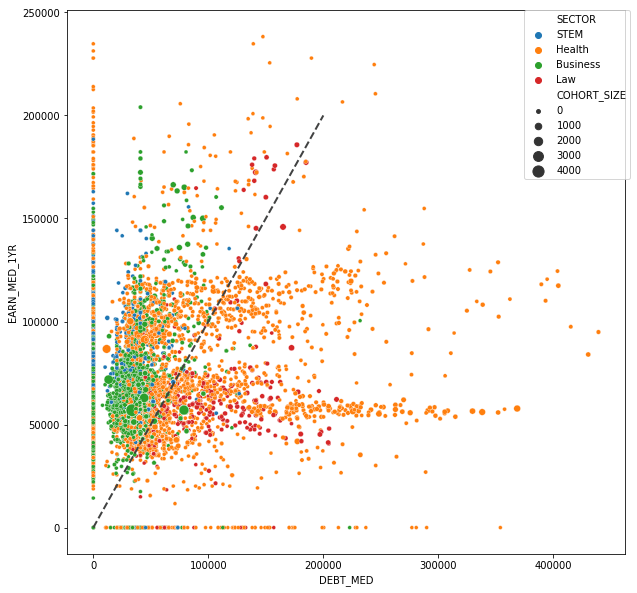

In [36]:
plt.figure(figsize=(10,10))
plt.plot([0,200000],[0,200000], lw=2, color='#414242', linestyle='dashed')
sns.scatterplot(data=df_top_sector, y="EARN_MED_1YR", x="DEBT_MED", hue="SECTOR", size="COHORT_SIZE", sizes = (15,150))
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)